In [63]:
import scipy.io
import scipy.stats
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from scipy.ndimage import label, map_coordinates

# 1.1  Ανίχνευση Δέρματος Προσώπου και Χεριών

In [64]:
mat = scipy.io.loadmat('cv22_lab2_material/part1 - GreekSignLanguage/skinSamplesRGB.mat')
skinSamplesRGB = mat['skinSamplesRGB']
skinSamplesRGB = np.reshape(skinSamplesRGB, (1, 1782, 3))
imgYCC = cv2.cvtColor(skinSamplesRGB, cv2.COLOR_RGB2YCrCb)[0, :, 1:]

Cr = imgYCC[:, 0]
Cb = imgYCC[:, 1]

cr_mean = np.mean(Cr)
cb_mean = np.mean(Cb)
mean_vect = [cb_mean, cr_mean]

cov_matrix = np.cov(np.transpose(imgYCC))
max_val = np.sqrt(np.linalg.det(cov_matrix)) * 2 * 3.14

print("μ = ", mean_vect)
print("Σ = ", cov_matrix)

μ =  [103.27048260381594, 157.0460157126824]
Σ =  [[ 44.19103128 -11.9310385 ]
 [-11.9310385   11.19574811]]


In [65]:
def bounding_box(image, max_val, mu, cov):
    imgcbcr = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)[:, :, 1:]
    frame = scipy.stats.multivariate_normal.pdf(imgcbcr, mean=mu, cov=cov)
    print(frame.shape)

    frame_normalized = frame * max_val
    frame_threshold = (frame_normalized > 0.05).astype(float)
    plt.imshow(frame_threshold, cmap='gray')
    plt.show()

    open_kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (3, 3))
    opening = cv2.morphologyEx(frame_threshold, cv2.MORPH_OPEN, open_kernel)
    plt.imshow(opening, cmap='gray')
    plt.show()
    close_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (53, 53))
    openclose = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, close_kernel)
    plt.imshow(openclose, cmap='gray')
    plt.show()

    labeled_array, num_features = label(openclose)
    head_vert, head_hor = np.where(labeled_array == 1)
    left_vert, left_hor = np.where(labeled_array == 2)
    right_vert, right_hor = np.where(labeled_array == 3)

    head_up = np.min(head_vert)
    head_down = np.max(head_vert)
    head_left = np.min(head_hor)
    head_right = np.max(head_hor)

    left_up = np.min(left_vert)
    left_down = np.max(left_vert)
    left_left = np.min(left_hor)
    left_right = np.max(left_hor)

    right_up = np.min(right_vert)
    right_down = np.max(right_vert)
    right_left = np.min(right_hor)
    right_right = np.max(right_hor)

    return ([head_left - 8, head_up, head_right - head_left + 16, head_down - head_up],
            [left_left - 16, left_up - 16, left_right - left_left + 32, left_down - left_up + 22],
            [right_left - 4, right_up - 4, right_right - right_left + 12, right_down - right_up + 12])

(420, 350)


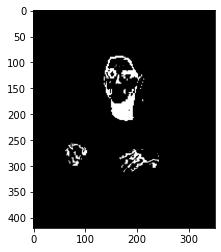

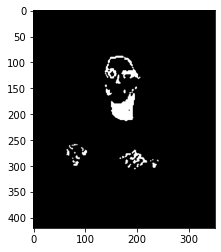

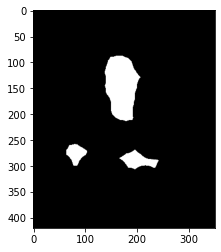

head =  [130, 88, 84, 125]
left =  [48, 242, 71, 63]
right =  [162, 265, 87, 49]


In [66]:
img1 = cv2.imread('cv22_lab2_material/part1 - GreekSignLanguage/1.png', cv2.IMREAD_COLOR)
test_image = np.roll(img1, 3, axis=1)
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
test_gray = cv2.cvtColor(test_image, cv2.COLOR_BGR2GRAY)

(head_box, left_box, right_box) = bounding_box(img1, max_val, mean_vect, cov_matrix)
print("head = ", head_box)
print("left = ", left_box)
print("right = ", right_box)

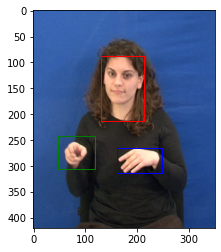

In [67]:
head_bb_1 = gray1[head_box[1]:head_box[1] + head_box[3], head_box[0]:head_box[0] + head_box[2]]
left_bb_1 = gray1[left_box[1]:left_box[1] + left_box[3], left_box[0]:left_box[0] + left_box[2]]
right_bb_1 = gray1[right_box[1]:right_box[1] + right_box[3], right_box[0]:right_box[0] + right_box[2]]

fig, ax = plt.subplots()
ax.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
rect = patches.Rectangle((head_box[0], head_box[1]), head_box[2], head_box[3], linewidth=1, edgecolor='r',
                         facecolor='none')
rect2 = patches.Rectangle((left_box[0], left_box[1]), left_box[2], left_box[3], linewidth=1, edgecolor='g',
                          facecolor='none')
rect3 = patches.Rectangle((right_box[0], right_box[1]), right_box[2], right_box[3], linewidth=1, edgecolor='b',
                          facecolor='none')
ax.add_patch(rect)
ax.add_patch(rect2)
ax.add_patch(rect3)
plt.show()

# 1.2 Παρακολούθηση Προσώπου και Χεριών

In [68]:
def lk(I1, I2, features, rho, epsilon, d_x0, d_y0):
    I1 = I1.astype(np.float) / 255
    I2 = I2.astype(np.float) / 255
    n = int(np.ceil(3 * rho) * 2 + 1)
    gauss1D = cv2.getGaussianKernel(n, rho)
    gauss2D = gauss1D @ gauss1D.T
    I1_y, I1_x = np.gradient(I1)

    threshold = 0.01
    result_matx = np.zeros(I1.shape)
    result_maty = np.zeros(I1.shape)
    features_moved_x = []
    features_moved_y = []

    for feature in features:
        (x, y) = (feature[0].astype(int)[0], feature[0].astype(int)[1])

        left_y_edge = max(0, y - (n - 1) // 2)
        right_y_edge = min(y + (n - 1) // 2, I1.shape[0])
        left_x_edge = max(0, x - (n - 1) // 2)
        right_x_edge = min(x + (n - 1) // 2, I1.shape[1])

        I_feat_1 = I1[left_y_edge:right_y_edge, left_x_edge:right_x_edge]
        I_feat_x = I1_x[left_y_edge:right_y_edge, left_x_edge:right_x_edge]
        I_feat_y = I1_y[left_y_edge:right_y_edge, left_x_edge:right_x_edge]

        x_index, y_index = np.meshgrid(np.arange(I_feat_1.shape[1]), np.arange(I_feat_1.shape[0]))
        d_x0_feat = d_x0[left_y_edge:right_y_edge, left_x_edge:right_x_edge]
        d_y0_feat = d_y0[left_y_edge:right_y_edge, left_x_edge:right_x_edge]
        dx, dy = d_x0_feat, d_y0_feat

        for i in range(900):
            Iprev = map_coordinates(I_feat_1, [np.ravel(y_index + d_y0_feat), np.ravel(x_index + d_x0_feat)], order=1) \
                .reshape(I_feat_1.shape[0], I_feat_1.shape[1])
            A1 = map_coordinates(I_feat_x, [np.ravel(y_index + d_y0_feat), np.ravel(x_index + d_x0_feat)], order=1) \
                .reshape(I_feat_x.shape[0], I_feat_x.shape[1])
            A2 = map_coordinates(I_feat_y, [np.ravel(y_index + d_y0_feat), np.ravel(x_index + d_x0_feat)], order=1) \
                .reshape(I_feat_y.shape[0], I_feat_y.shape[1])

            E = I2[left_y_edge:right_y_edge, left_x_edge:right_x_edge] - Iprev

            a11 = cv2.filter2D(A1 ** 2, -1, gauss2D) + epsilon
            a12 = cv2.filter2D(A1 * A2, -1, gauss2D)
            a22 = cv2.filter2D(A2 ** 2, -1, gauss2D) + epsilon
            b1 = cv2.filter2D(A1 * E, -1, gauss2D)
            b2 = cv2.filter2D(A2 * E, -1, gauss2D)
            det = a11 * a22 - a12 * a12
            u_x = (a22 * b1 - a12 * b2) / det
            u_y = (a11 * b2 - a12 * b1) / det
            dx += u_x
            dy += u_y
            if np.linalg.norm(u_x) < threshold and np.linalg.norm(u_y) < threshold:
                break

        result_matx[y, x] = dx[(min(y + n // 2, I1.shape[0]) - max(0, y - n // 2)) // 2][
            (min(x + n // 2, I1.shape[1]) - max(0, x - n // 2)) // 2]
        result_maty[y, x] = dy[(min(y + n // 2, I1.shape[0]) - max(0, y - n // 2)) // 2][
            (min(x + n // 2, I1.shape[1]) - max(0, x - n // 2)) // 2]
        features_moved_x.append(result_matx[y, x])
        features_moved_y.append(result_maty[y, x])
    return result_matx, result_maty, features_moved_x, features_moved_y


def GREDUCE(I):
    gauss1D = cv2.getGaussianKernel(19, 3)
    gauss2D = gauss1D @ gauss1D.T
    convoluted_image = cv2.filter2D(I, -1, gauss2D)
    return convoluted_image[0::2, 0::2]


def GPyramid(I, depth):
    g_pyr = [I]
    for i in range(depth - 1):
        g_pyr.append(GREDUCE(g_pyr[i]))
    g_pyr.reverse()
    return g_pyr


def displ(arr1, arr2, thres=0.1):
    opt_vect = []

    for dx, dy in zip(arr1, arr2):
        E = dx**2 + dy**2
        if E <= thres:
            continue
        opt_vect.append(np.array([dx, dy]))

    if len(opt_vect) == 0:
        return [0.0, 0.0]

    opt_vect = np.array(opt_vect)
    dxs = opt_vect[:, 0]
    dys = opt_vect[:, 1]

    return [np.mean(dxs), np.mean(dys)]


def lk_Gpyramid(I1, I2, rho, epsilon, depth, maxCorners):
    Gp_1 = GPyramid(I1, depth)
    Gp_2 = GPyramid(I2, depth)
    d_x0 = np.zeros(Gp_1[0].shape)
    d_y0 = np.zeros(Gp_1[0].shape)
    [displ_x, displ_y] = [0, 0]
    [resx, resy] = [0, 0]
    for i in range(depth):
        blockSize = 7
        feature_params = dict(maxCorners=maxCorners, qualityLevel=0.001, minDistance=7, blockSize=blockSize)
        features = cv2.goodFeaturesToTrack(Gp_2[i], mask=None, **feature_params)
        while features is None and blockSize > 2:
            blockSize -= 2
            feature_params = dict(maxCorners=maxCorners, qualityLevel=0.001, minDistance=7, blockSize=blockSize)
            features = cv2.goodFeaturesToTrack(Gp_2[i], mask=None, **feature_params)
        if blockSize < 2:
            [displ_x, displ_y] = [0, 0]
        else:
            resx, resy, features_moved_x, features_moved_y = lk(Gp_1[i], Gp_2[i], features, rho, epsilon, d_x0, d_y0)
            [displ_x, displ_y] = displ(features_moved_x, features_moved_y)
        if i < depth - 1:
            d_x0 = np.full(Gp_1[i + 1].shape, displ_x * 2)
            d_y0 = np.full(Gp_1[i + 1].shape, displ_y * 2)

    return displ_x, displ_y, resx, resy


def display_flow(resx, resy):
    plt.quiver(-resx, -resy, angles='xy', width=0.003, color='blue', scale=100)
    plt.gca().invert_yaxis()
    plt.show()

In [69]:
test_head_bb = test_gray[head_box[1]:head_box[1] + head_box[3], head_box[0]:head_box[0] + head_box[2]]
test_left_bb = test_gray[left_box[1]:left_box[1] + left_box[3], left_box[0]:left_box[0] + left_box[2]]
test_right_bb = test_gray[right_box[1]:right_box[1] + right_box[3], right_box[0]:right_box[0] + right_box[2]]

head_displ_x, head_displ_y, head_bb_moved_x, head_bb_moved_y = lk_Gpyramid(head_bb_1, test_head_bb, 4, 0.01, 3, 17)
print("test head = ", head_displ_x, head_displ_y)
left_displ_x, left_displ_y, left_bb_moved_x, left_bb_moved_y = lk_Gpyramid(left_bb_1, test_left_bb, 4, 0.01, 3, 15)
print("test left = ", left_displ_x, left_displ_y)
right_displ_x, right_displ_y, right_bb_moved_x, right_bb_moved_y = lk_Gpyramid(right_bb_1, test_right_bb, 4, 0.01, 3, 15)
print("test right = ", right_displ_x, right_displ_y)

test head =  -3.0006065787118112 -0.008011490044212786
test left =  -2.9931632182218117 -0.006055489009243781
test right =  -3.0117591028465256 0.009013562852188874


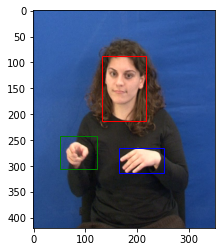

In [70]:
head_box = [head_box[0] - int(np.round(head_displ_x)), head_box[1] - int(np.round(head_displ_y)), head_box[2],
            head_box[3]]
left_box = [left_box[0] - int(np.round(left_displ_x)), left_box[1] - int(np.round(left_displ_y)), left_box[2],
            left_box[3]]
right_box = [right_box[0] - int(np.round(right_displ_x)), right_box[1] - int(np.round(right_displ_y)), right_box[2],
             right_box[3]]

fig, ax = plt.subplots()
ax.imshow(cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB))
rect = patches.Rectangle((head_box[0], head_box[1]), head_box[2], head_box[3], linewidth=1, edgecolor='r',
                         facecolor='none')
rect2 = patches.Rectangle((left_box[0], left_box[1]), left_box[2], left_box[3], linewidth=1, edgecolor='g',
                          facecolor='none')
rect3 = patches.Rectangle((right_box[0], right_box[1]), right_box[2], right_box[3], linewidth=1, edgecolor='b',
                          facecolor='none')
ax.add_patch(rect)
ax.add_patch(rect2)
ax.add_patch(rect3)
plt.show()

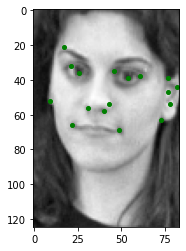

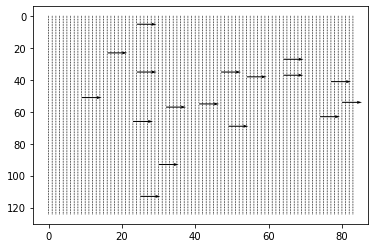

<Figure size 432x288 with 0 Axes>

In [71]:
feature_params = dict(maxCorners=17, qualityLevel=0.001, minDistance=5, blockSize=5)
test_head_features = cv2.goodFeaturesToTrack(test_head_bb, mask=None, **feature_params)
plt.imshow(test_head_bb, cmap='gray')
plt.plot(test_head_features[:, 0, 0], test_head_features[:, 0, 1], color='green', marker='o', linestyle='None',
         markersize=4)
plt.show()
plt.clf()
plt.quiver(-head_bb_moved_x, -head_bb_moved_y, angles='xy', width=0.003, scale=1 / 0.02)
plt.gca().invert_yaxis()
plt.show()
plt.clf()

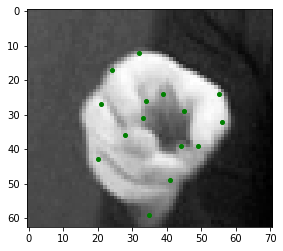

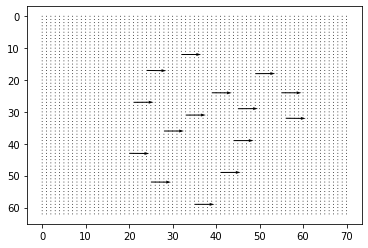

<Figure size 432x288 with 0 Axes>

In [72]:
feature_params = dict(maxCorners=15, qualityLevel=0.001, minDistance=5, blockSize=7)
test_left_features = cv2.goodFeaturesToTrack(test_left_bb, mask=None, **feature_params)
plt.imshow(test_left_bb, cmap='gray')
plt.plot(test_left_features[:, 0, 0], test_left_features[:, 0, 1], color='green', marker='o', linestyle='None',
         markersize=4)
plt.show()
plt.clf()
plt.quiver(-left_bb_moved_x, -left_bb_moved_y, angles='xy', width=0.003, scale=1 / 0.02)
plt.gca().invert_yaxis()
plt.show()
plt.clf()

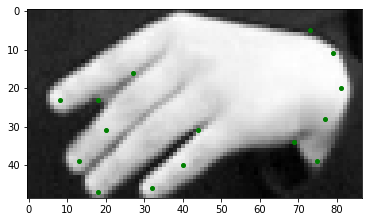

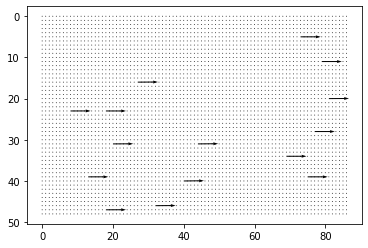

<Figure size 432x288 with 0 Axes>

In [73]:
feature_params = dict(maxCorners=15, qualityLevel=0.001, minDistance=5, blockSize=7)
test_right_features = cv2.goodFeaturesToTrack(test_right_bb, mask=None, **feature_params)
plt.imshow(test_right_bb, cmap='gray')
plt.plot(test_right_features[:, 0, 0], test_right_features[:, 0, 1], color='green', marker='o', linestyle='None',
         markersize=4)
plt.show()
plt.clf()
plt.quiver(-right_bb_moved_x, -right_bb_moved_y, angles='xy', width=0.003, scale=1 / 0.02)
plt.gca().invert_yaxis()
plt.show()
plt.clf()

In [74]:
img1 = cv2.imread('cv22_lab2_material/part1 - GreekSignLanguage/1.png', cv2.IMREAD_COLOR)
img2 = cv2.imread('cv22_lab2_material/part1 - GreekSignLanguage/2.png', cv2.IMREAD_COLOR)

gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

(head_box, left_box, right_box) = ([130, 88, 84, 125], [47, 243, 71, 66], [162, 265, 87, 49])

head_bb_1 = gray1[head_box[1]:head_box[1] + head_box[3], head_box[0]:head_box[0] + head_box[2]]
left_bb_1 = gray1[left_box[1]:left_box[1] + left_box[3], left_box[0]:left_box[0] + left_box[2]]
right_bb_1 = gray1[right_box[1]:right_box[1] + right_box[3], right_box[0]:right_box[0] + right_box[2]]

head_bb_2 = gray2[head_box[1]:head_box[1] + head_box[3], head_box[0]:head_box[0] + head_box[2]]
left_bb_2 = gray2[left_box[1]:left_box[1] + left_box[3], left_box[0]:left_box[0] + left_box[2]]
right_bb_2 = gray2[right_box[1]:right_box[1] + right_box[3], right_box[0]:right_box[0] + right_box[2]]

rho = 1
e = 0.01
head_displ_x, head_displ_y, head_bb_moved_x, head_bb_moved_y = lk_Gpyramid(head_bb_1, head_bb_2, rho, e, 3, 13)
left_displ_x, left_displ_y, left_bb_moved_x, left_bb_moved_y = lk_Gpyramid(left_bb_1, left_bb_2, rho, e, 3, 15)
right_displ_x, right_displ_y, right_bb_moved_x, right_bb_moved_y = lk_Gpyramid(right_bb_1, right_bb_2, rho, e, 3, 10)

print("head = ", head_displ_x, head_displ_y)
print("left = ", left_displ_x, left_displ_y)
print("right = ", right_displ_x, right_displ_y)

head =  -0.5545890915615996 1.6123941554447947
left =  2.400954535236869 4.480146639242933
right =  0.7662665253271076 1.6770544661342257


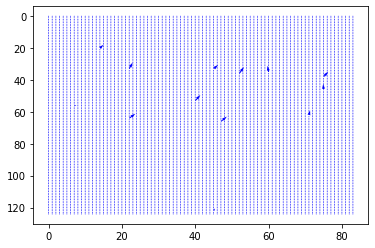

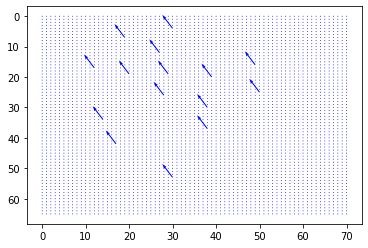

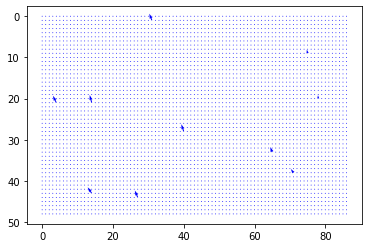

In [75]:
display_flow(head_bb_moved_x, head_bb_moved_y)
display_flow(left_bb_moved_x, left_bb_moved_y)
display_flow(right_bb_moved_x, right_bb_moved_y)

figure 2


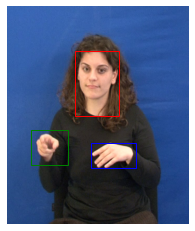

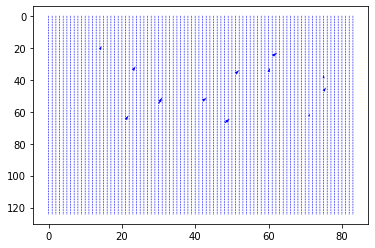

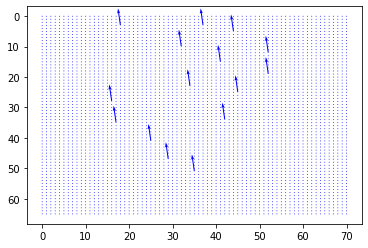

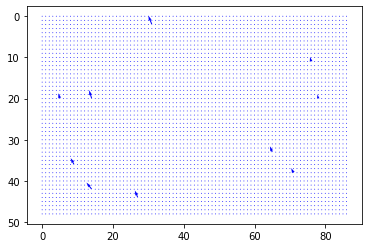

figure 3


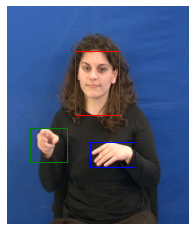

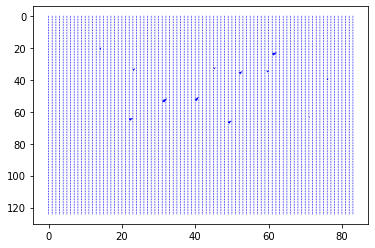

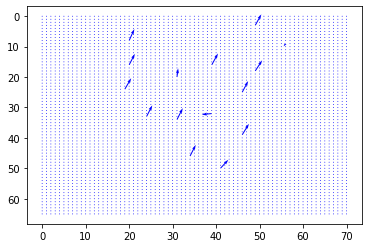

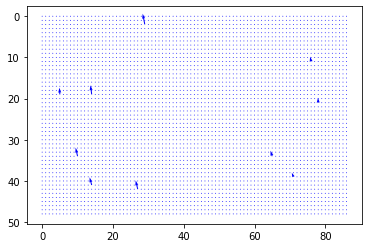

figure 4


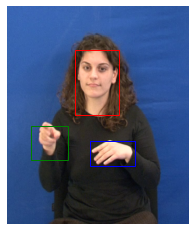

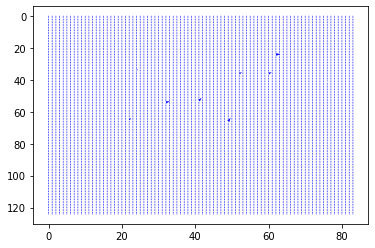

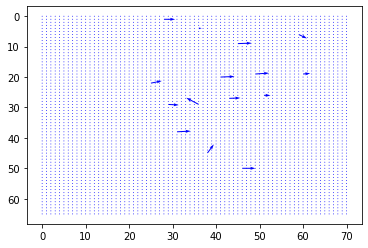

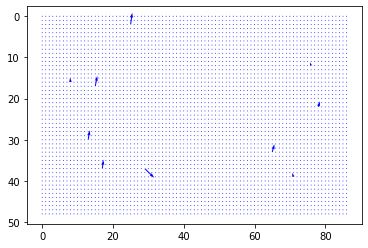

figure 5


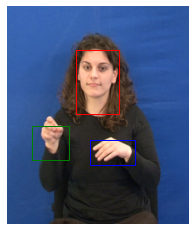

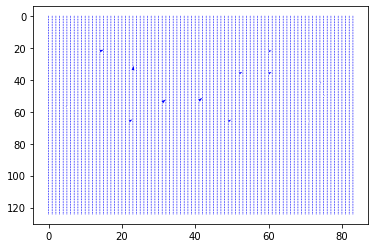

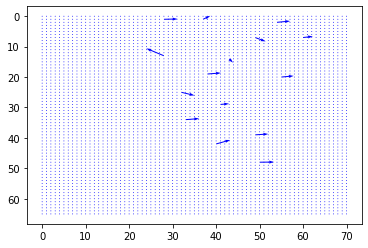

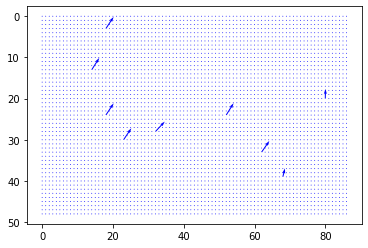

figure 6


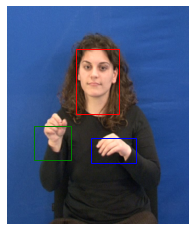

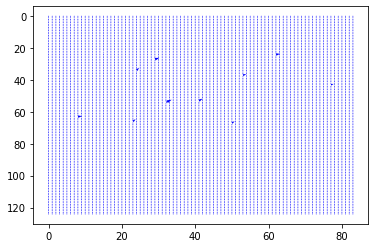

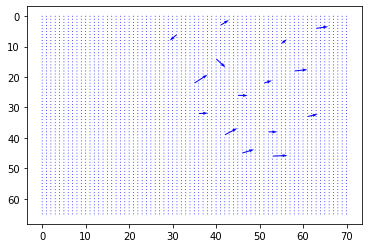

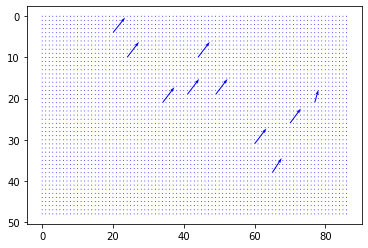

figure 7


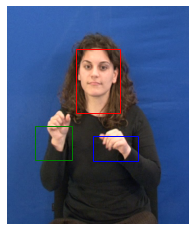

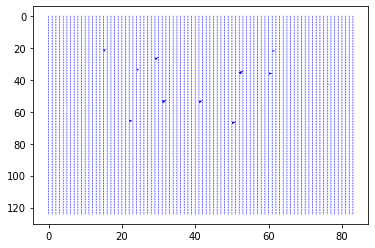

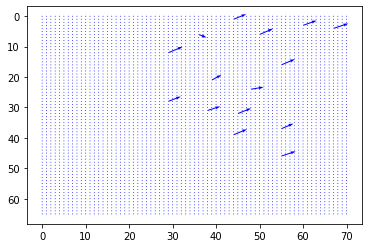

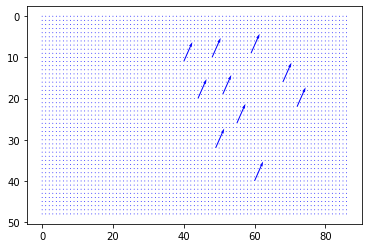

figure 8


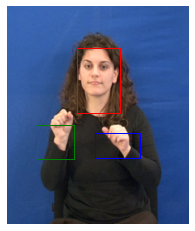

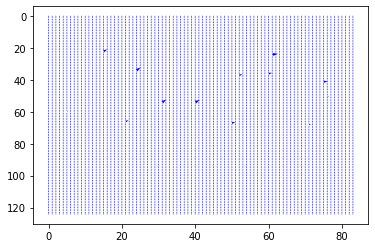

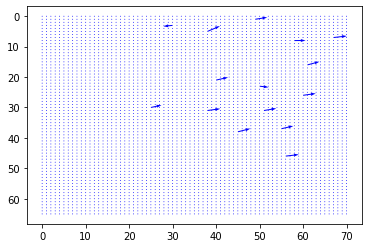

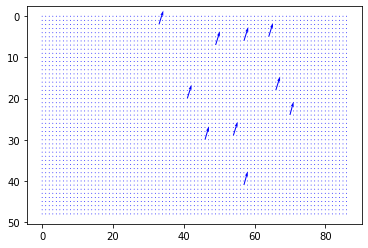

figure 9


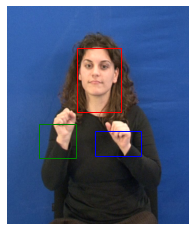

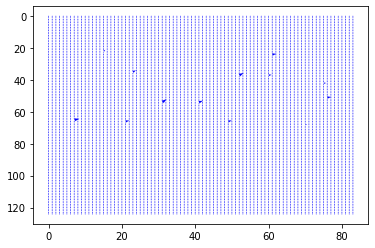

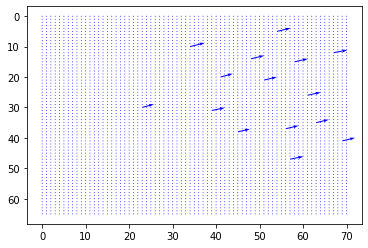

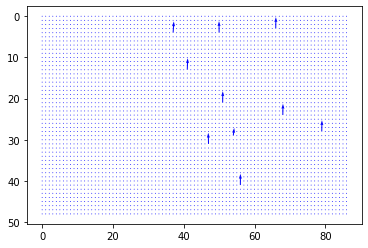

figure 10


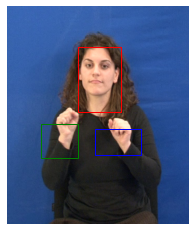

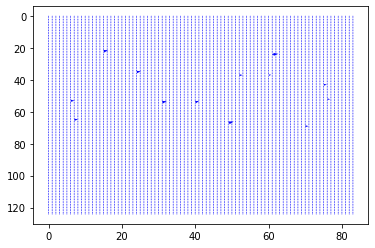

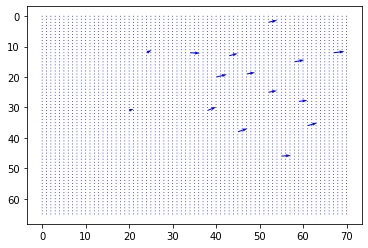

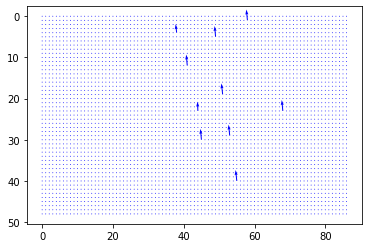

figure 11


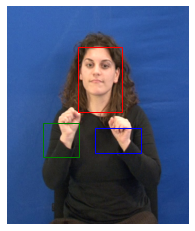

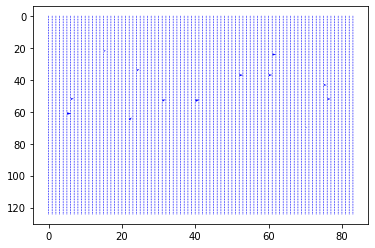

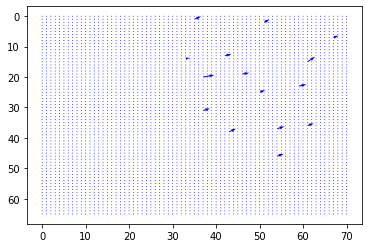

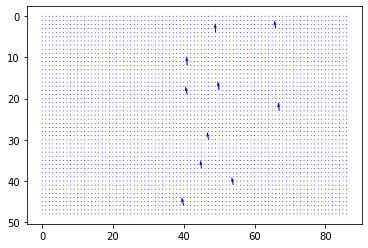

figure 12


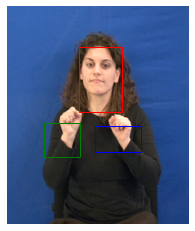

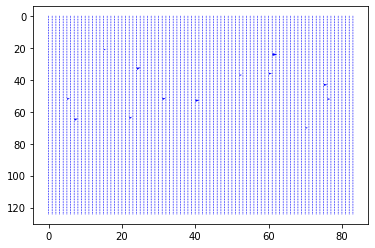

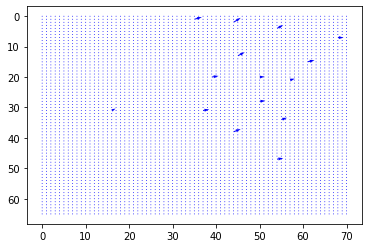

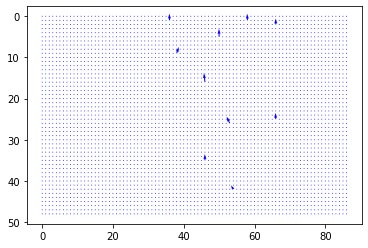

figure 13


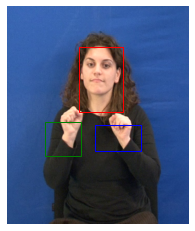

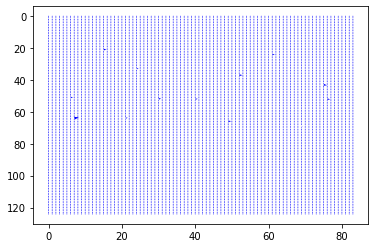

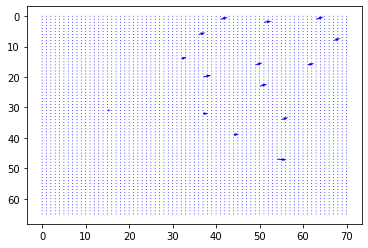

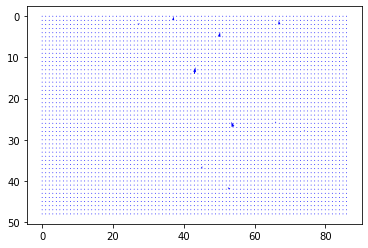

figure 14


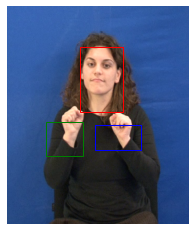

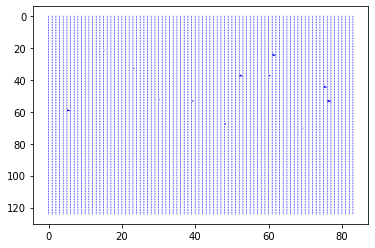

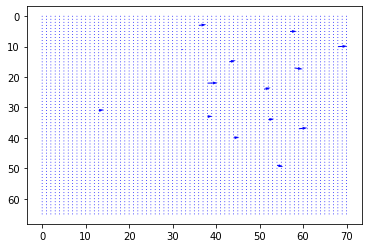

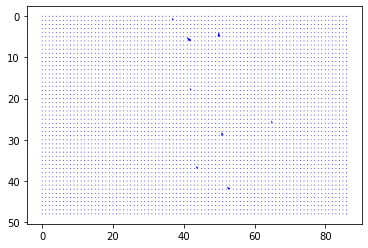

figure 15


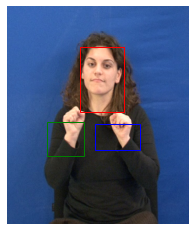

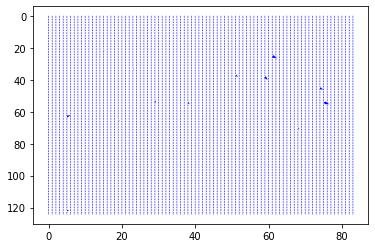

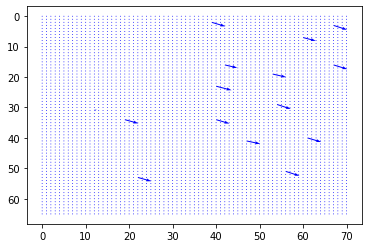

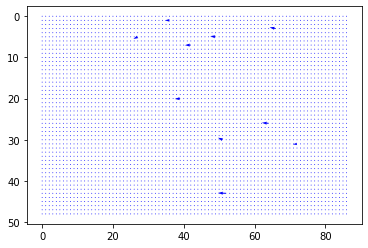

figure 16


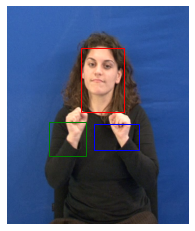

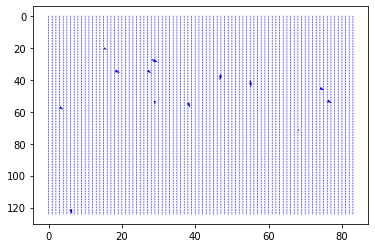

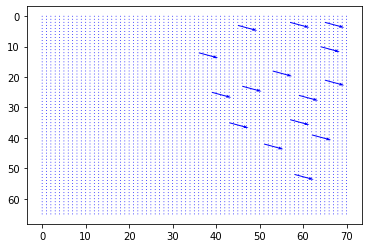

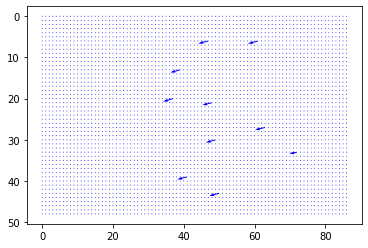

figure 17


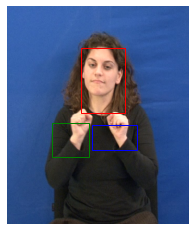

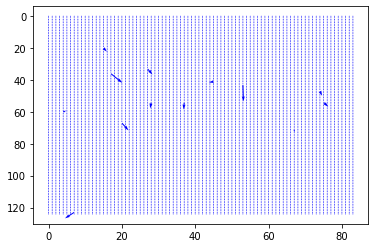

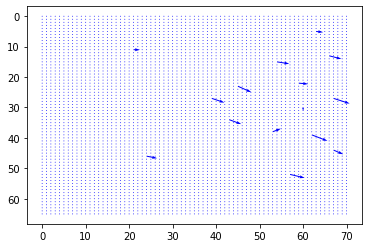

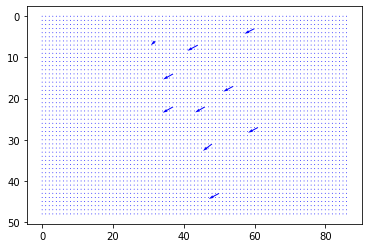

figure 18


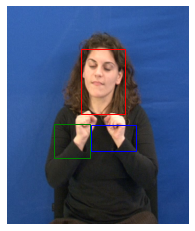

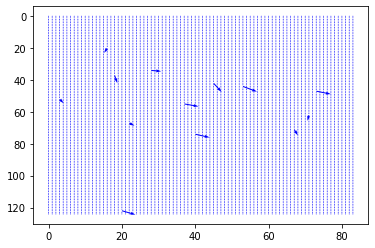

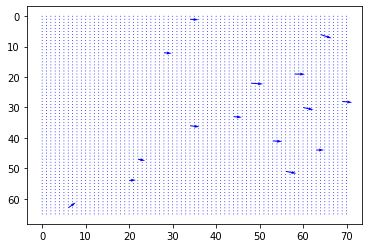

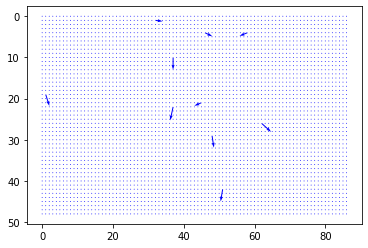

figure 19


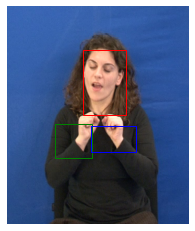

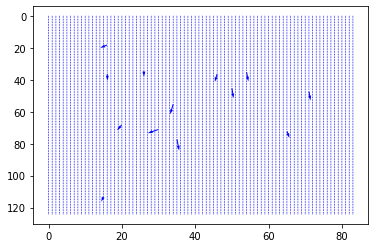

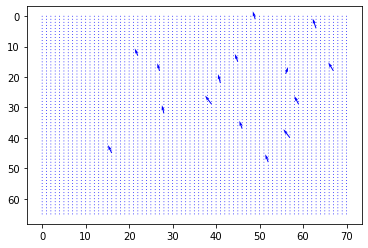

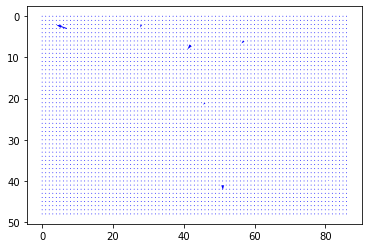

figure 20


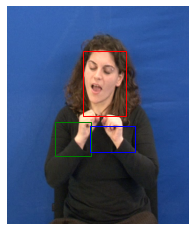

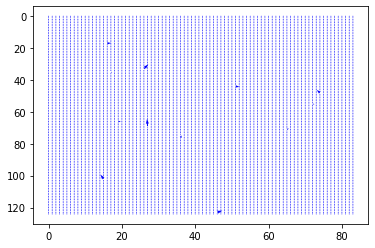

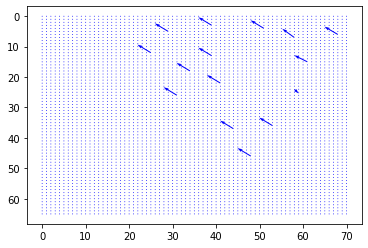

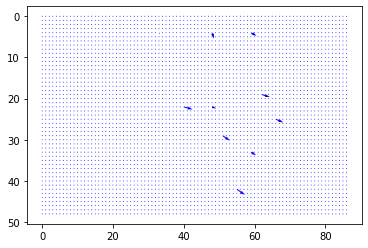

figure 21


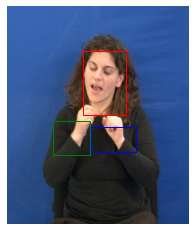

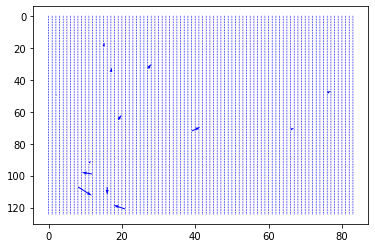

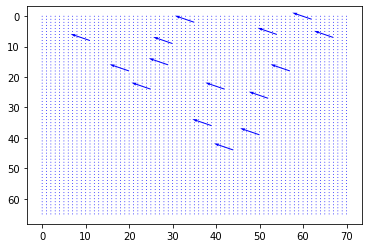

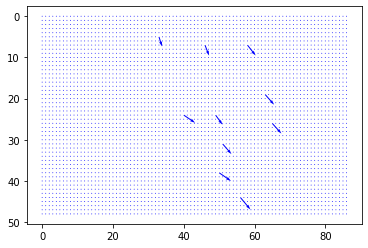

figure 22


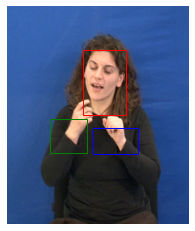

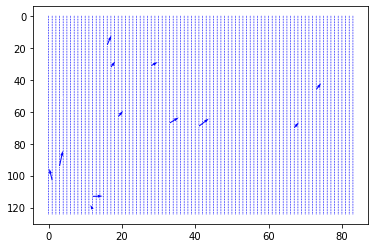

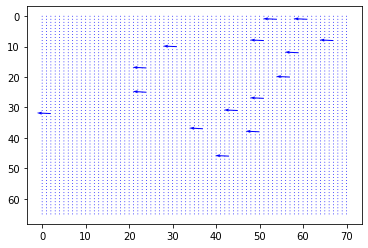

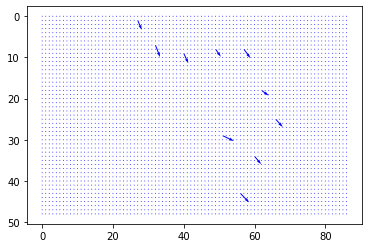

figure 23


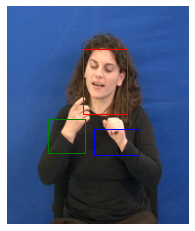

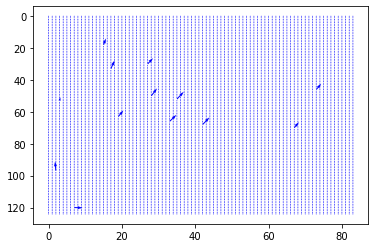

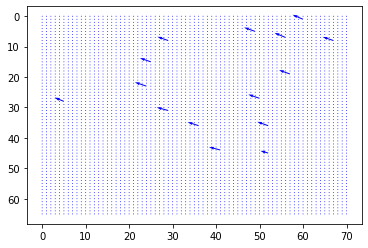

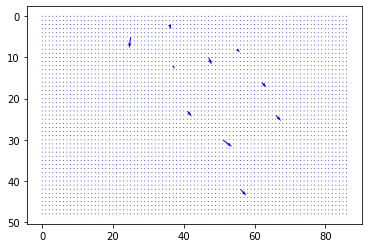

figure 24


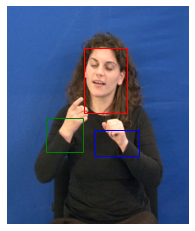

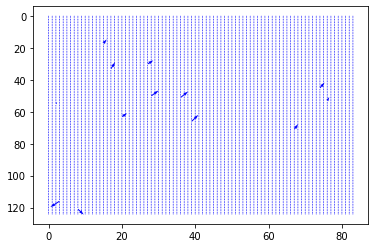

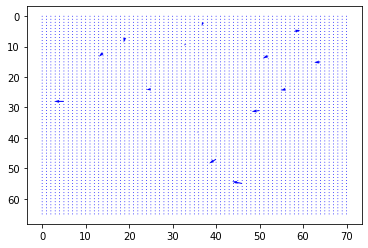

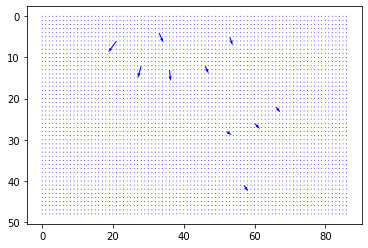

figure 25


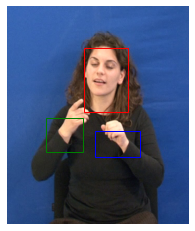

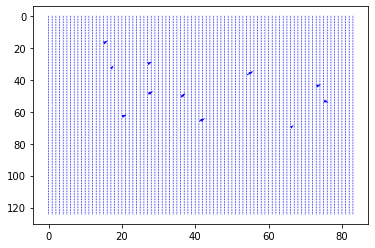

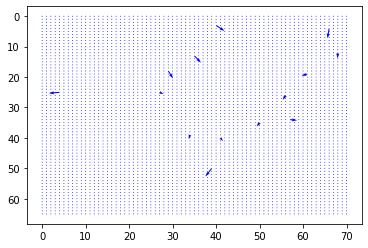

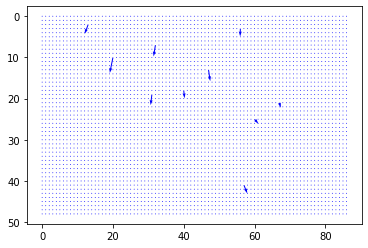

figure 26


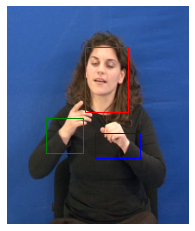

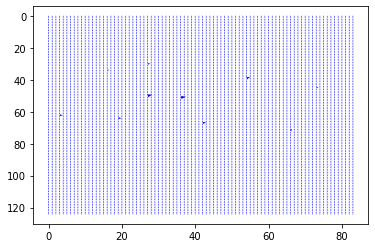

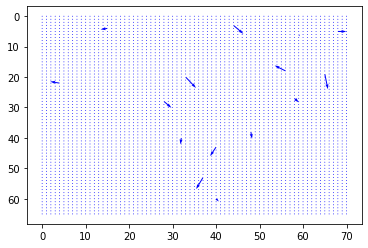

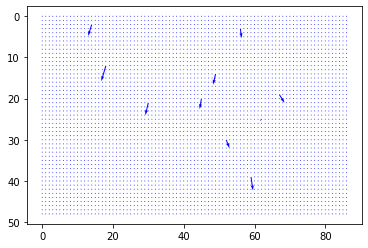

figure 27


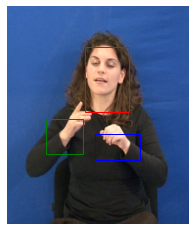

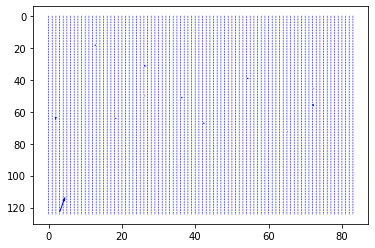

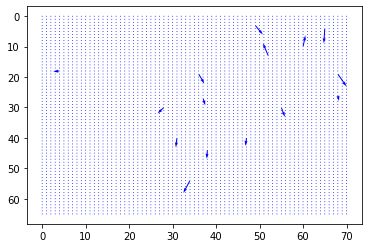

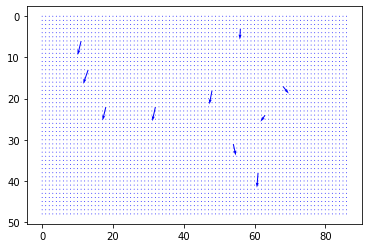

figure 28


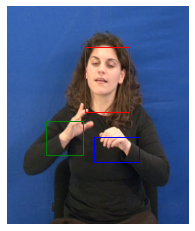

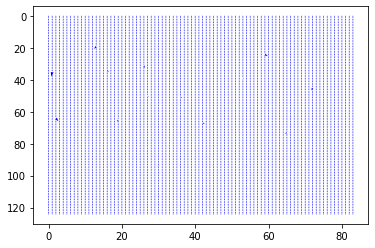

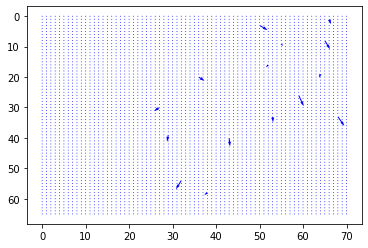

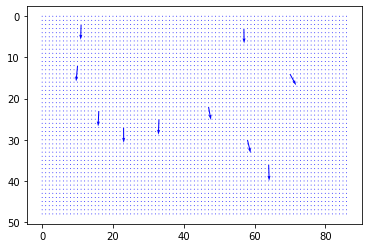

figure 29


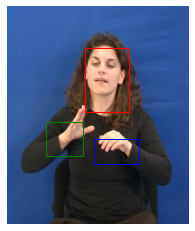

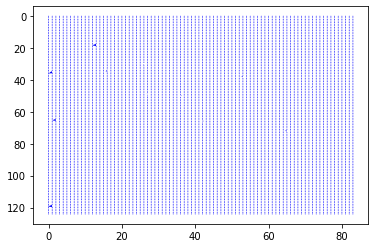

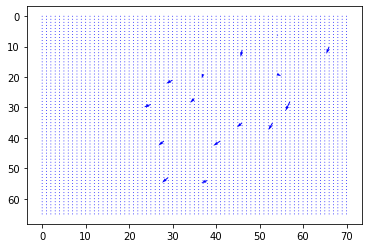

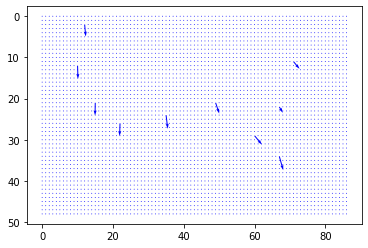

figure 30


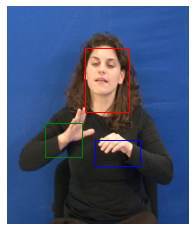

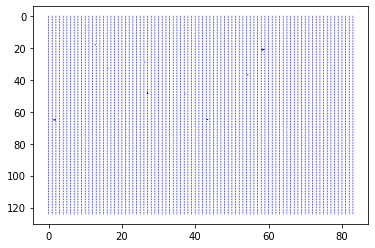

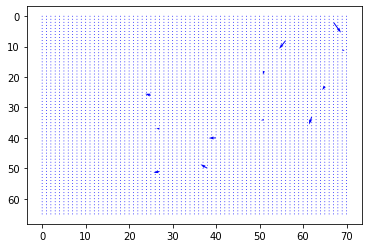

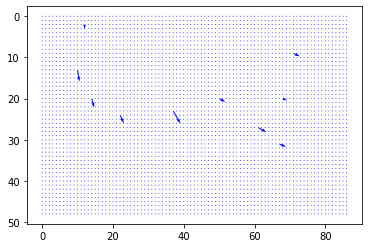

figure 31


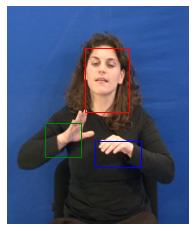

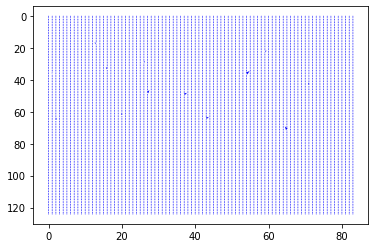

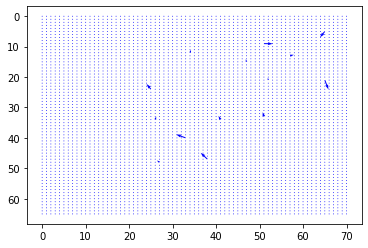

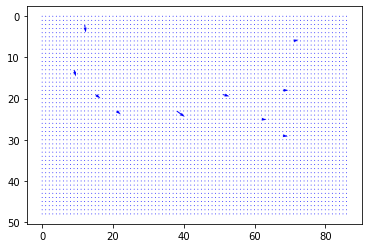

figure 32


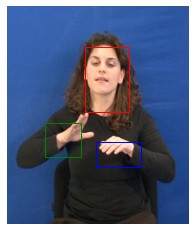

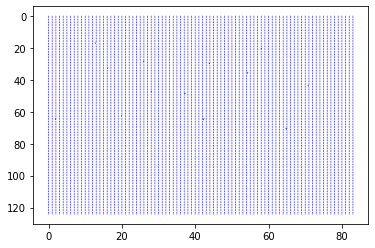

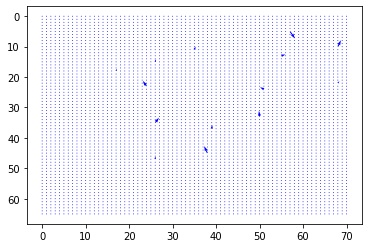

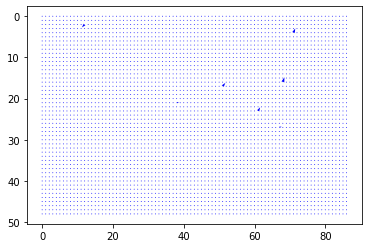

figure 33


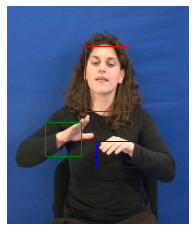

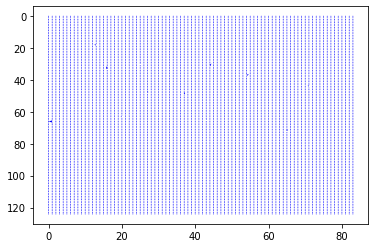

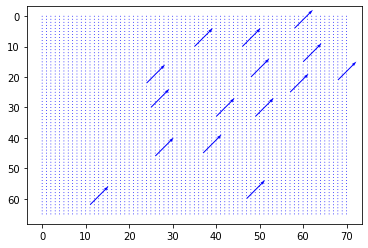

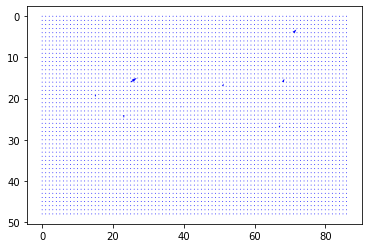

figure 34


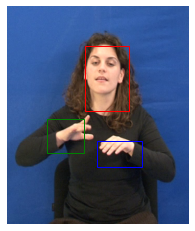

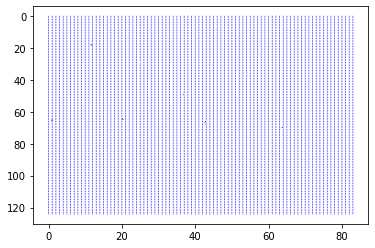

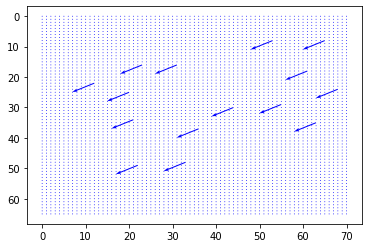

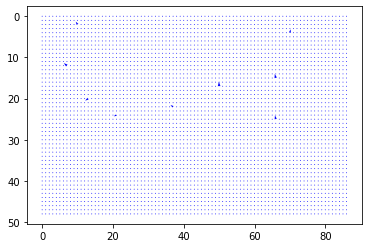

figure 35


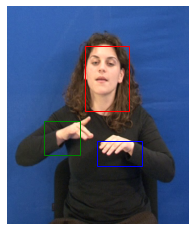

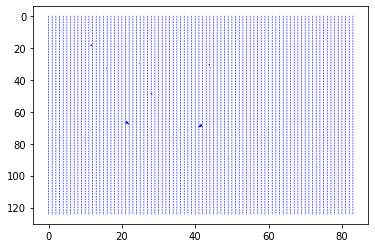

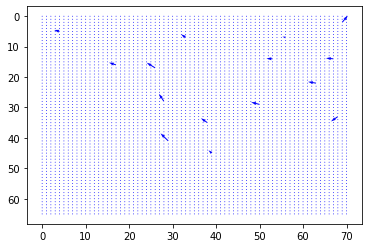

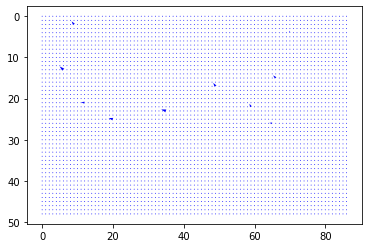

figure 36


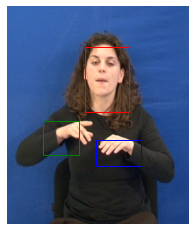

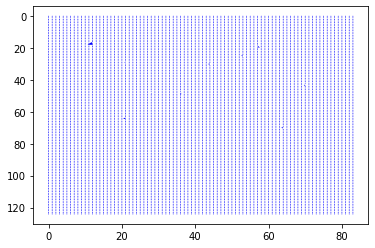

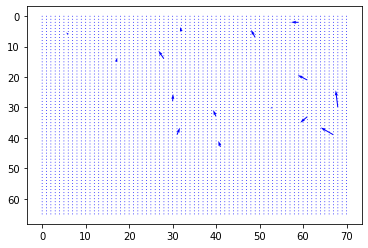

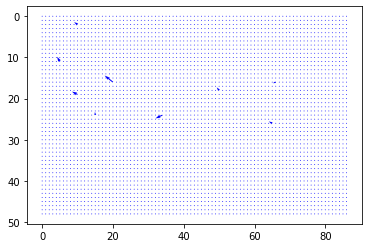

figure 37


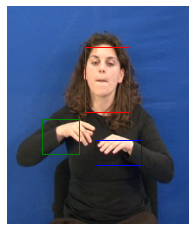

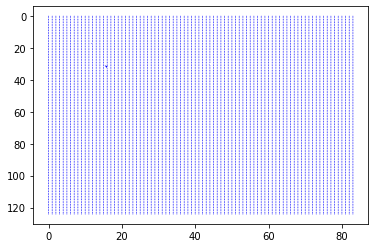

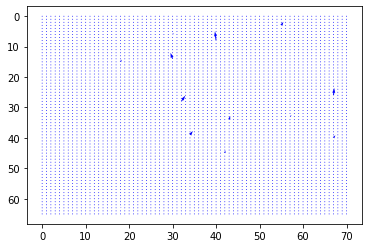

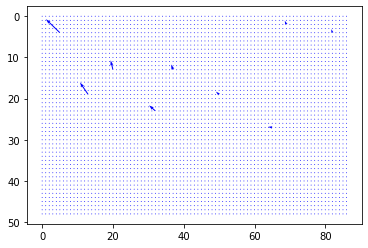

figure 38


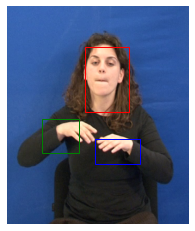

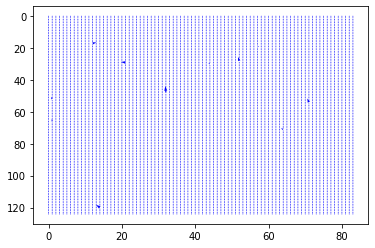

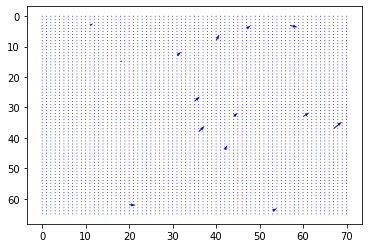

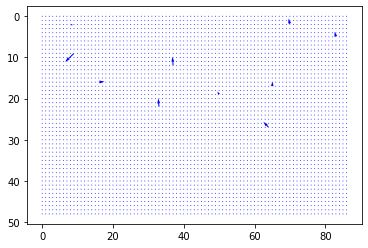

figure 39


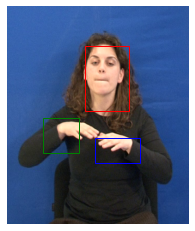

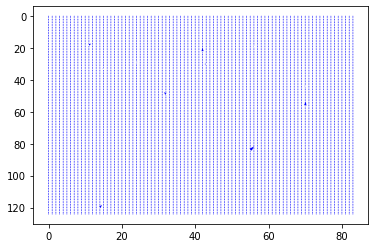

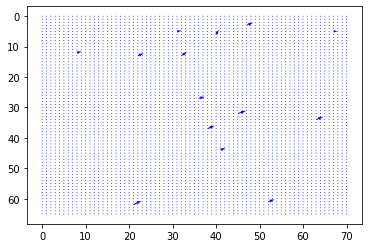

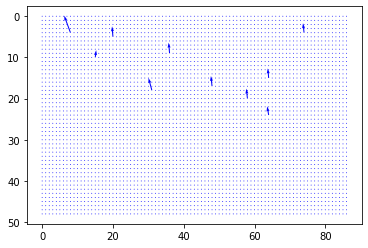

figure 40


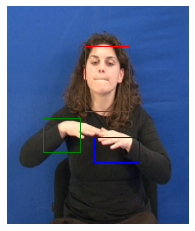

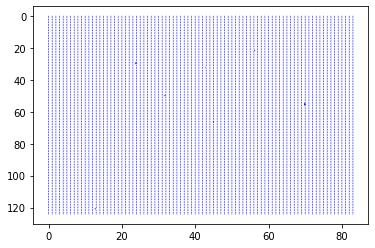

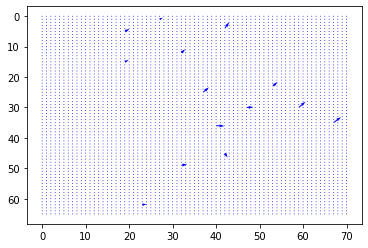

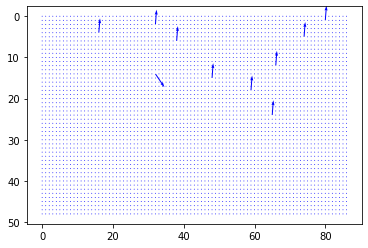

figure 41


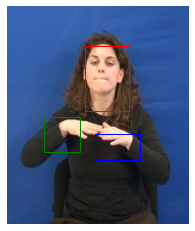

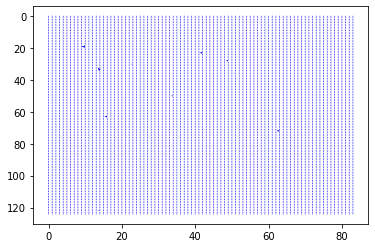

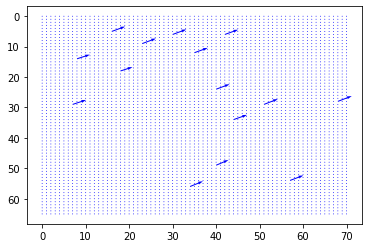

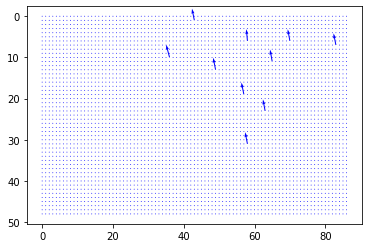

figure 42


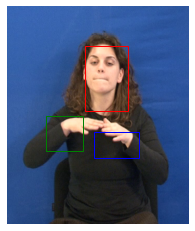

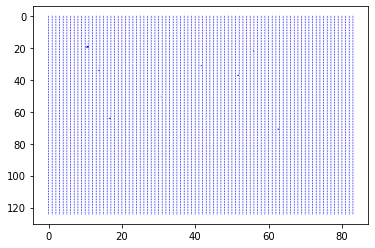

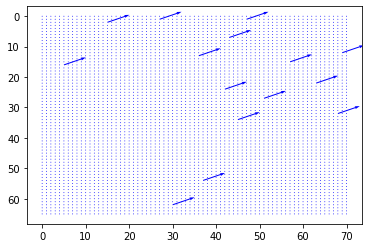

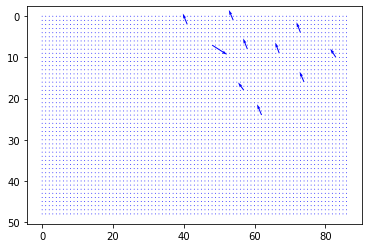

figure 43


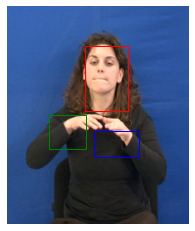

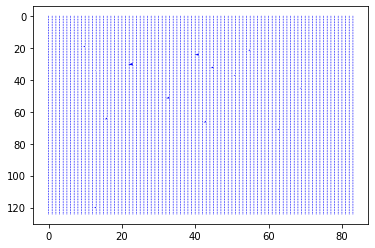

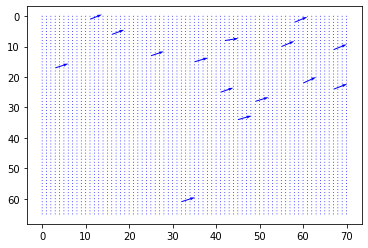

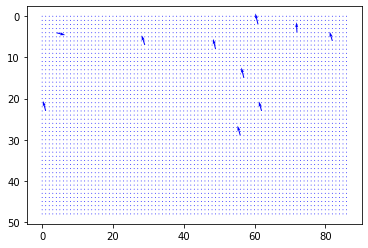

figure 44


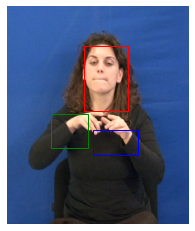

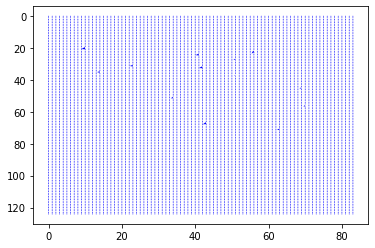

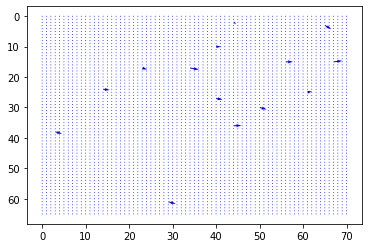

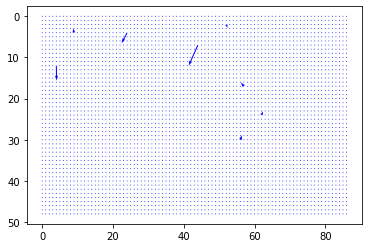

figure 45


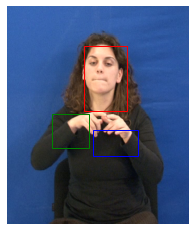

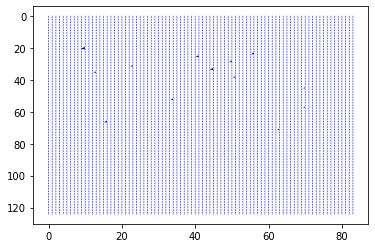

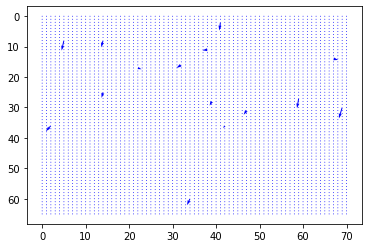

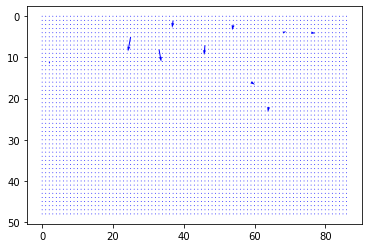

figure 46


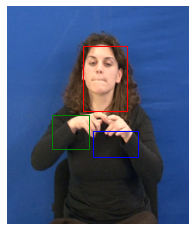

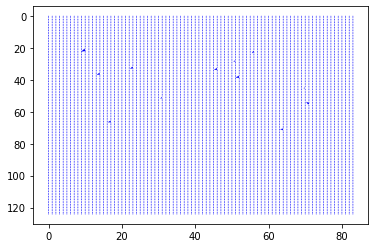

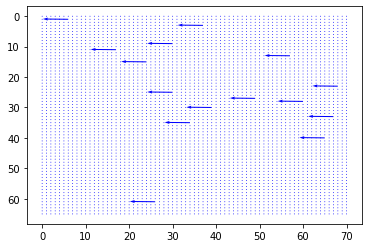

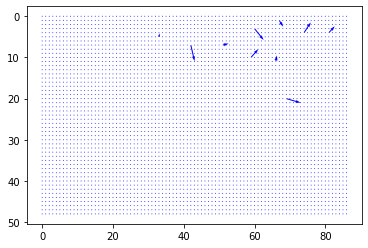

figure 47


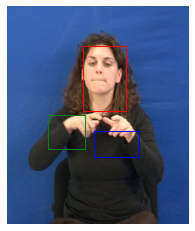

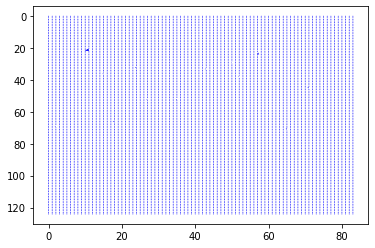

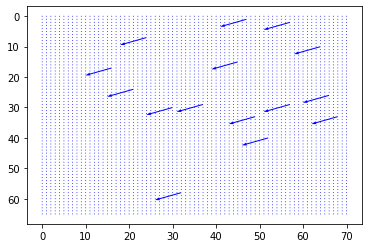

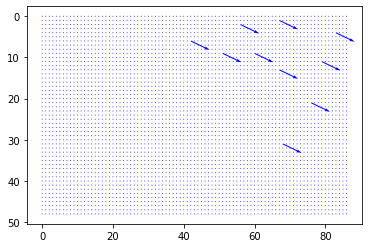

figure 48


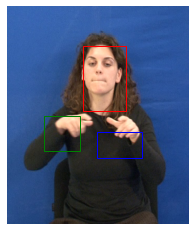

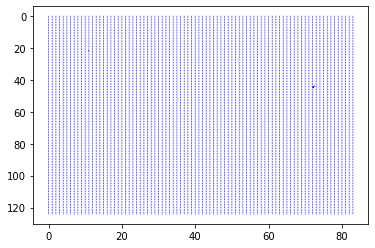

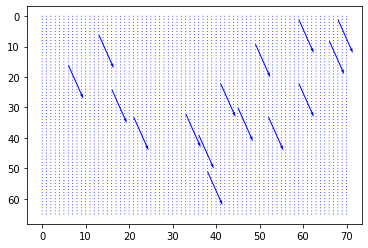

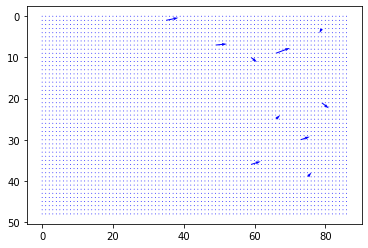

figure 49


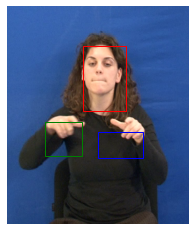

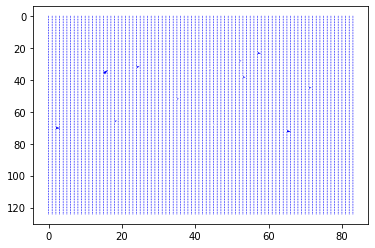

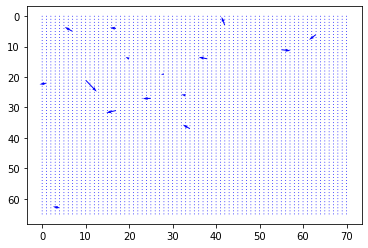

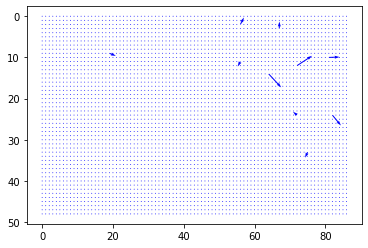

figure 50


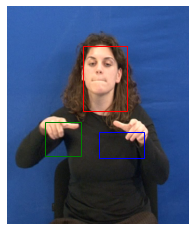

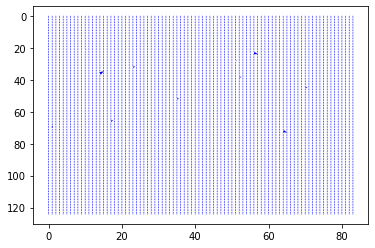

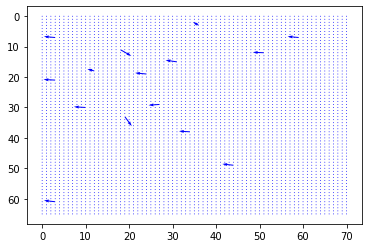

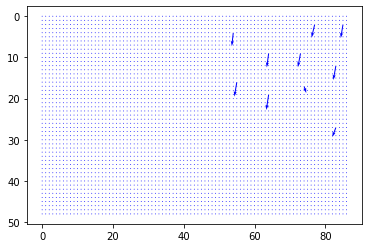

figure 51


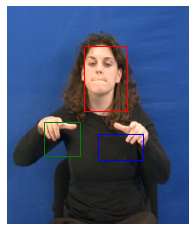

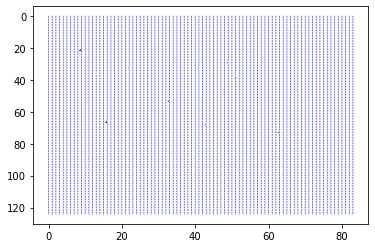

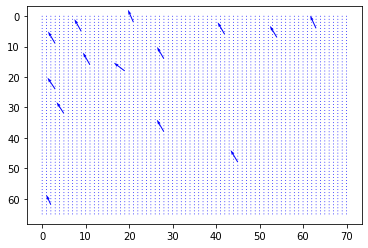

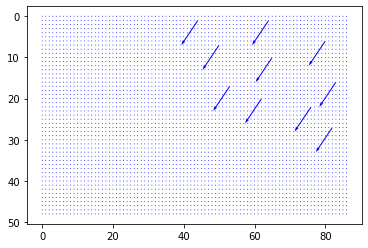

figure 52


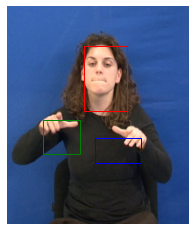

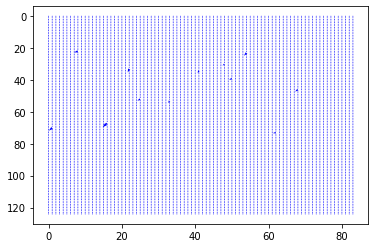

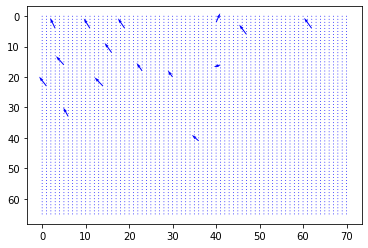

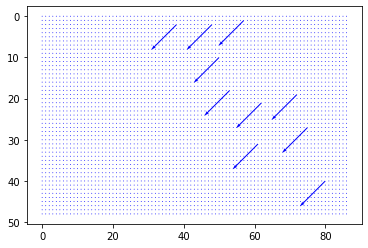

figure 53


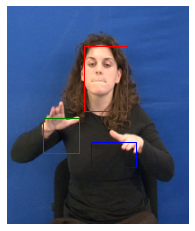

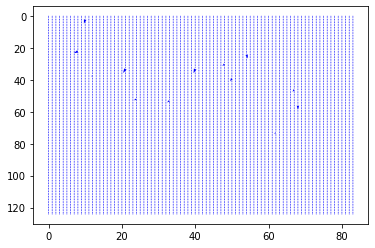

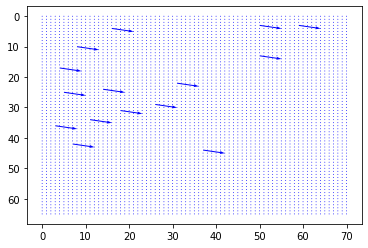

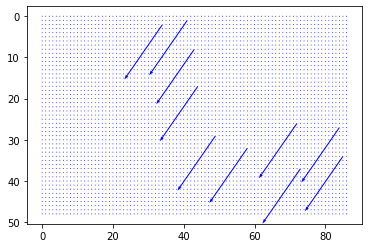

figure 54


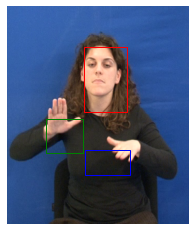

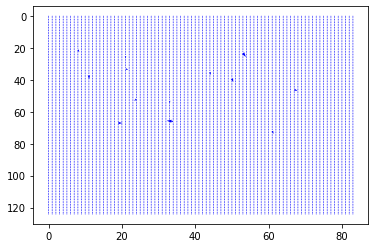

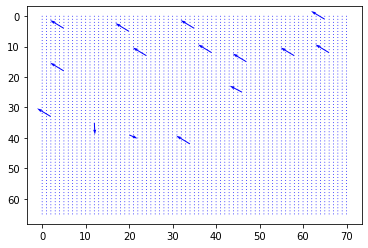

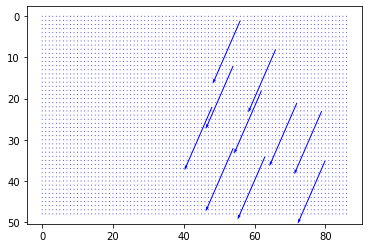

figure 55


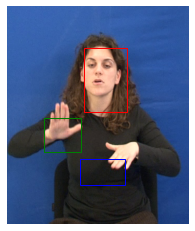

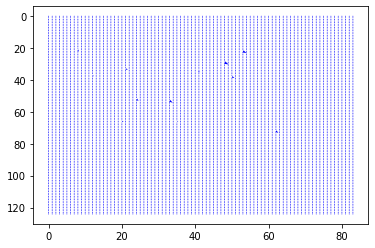

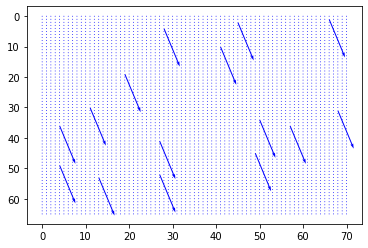

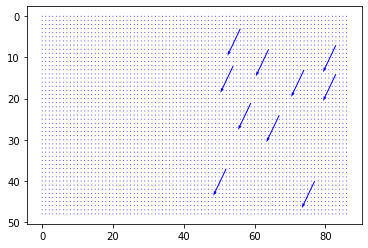

figure 56


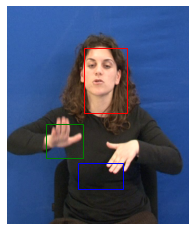

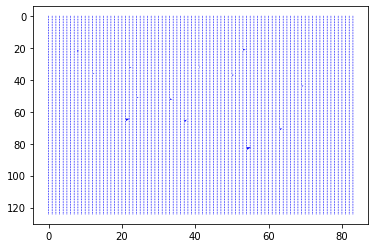

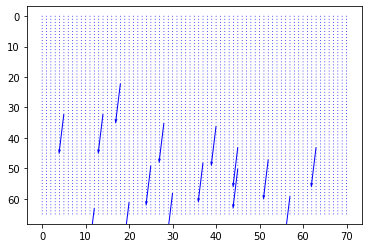

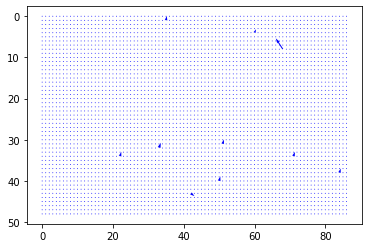

figure 57


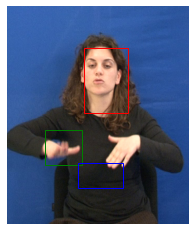

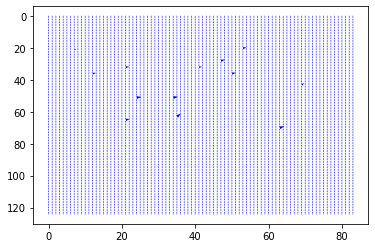

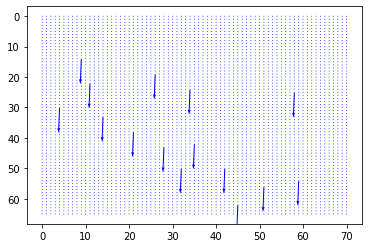

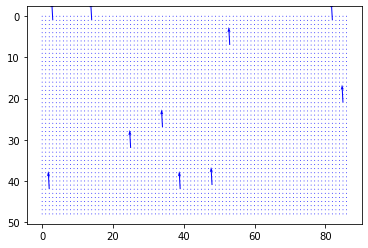

figure 58


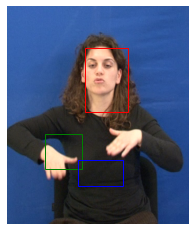

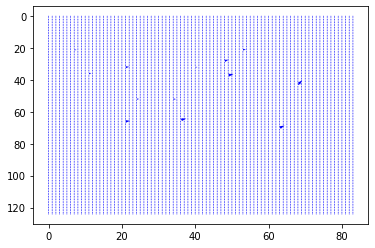

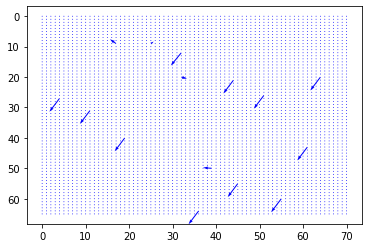

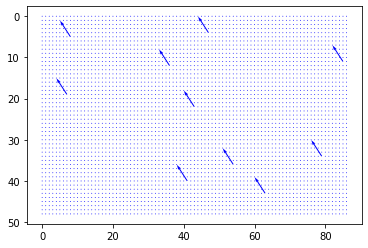

figure 59


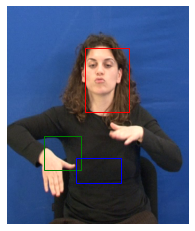

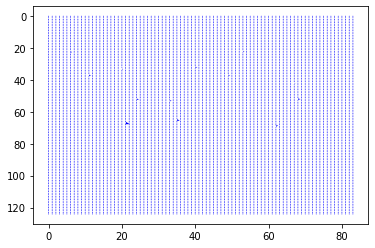

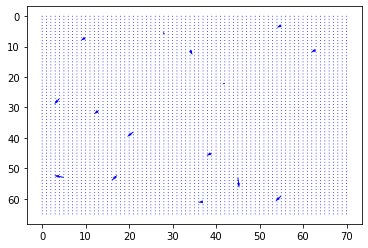

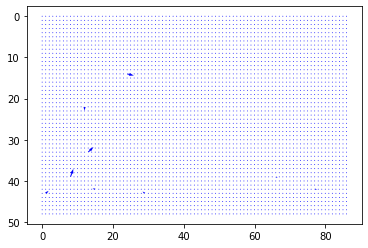

figure 60


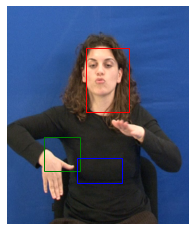

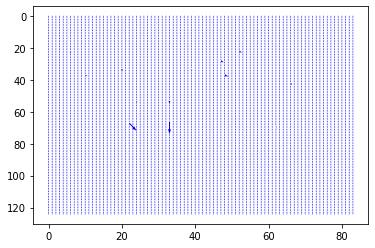

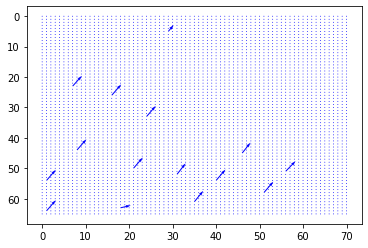

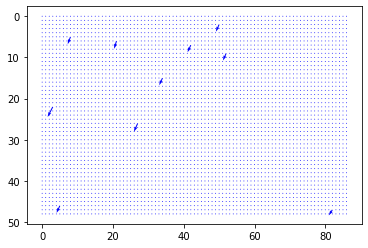

figure 61


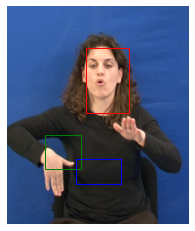

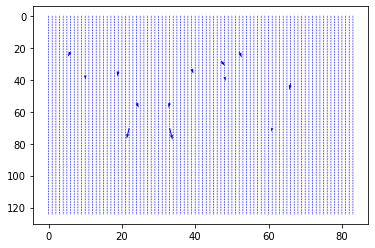

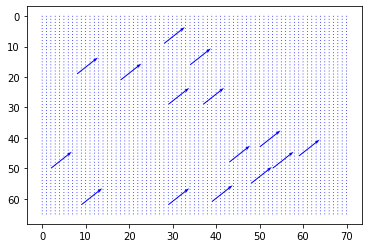

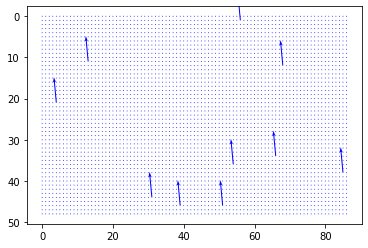

figure 62


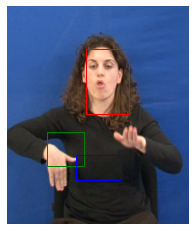

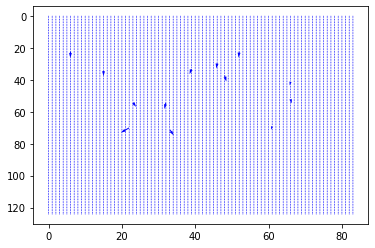

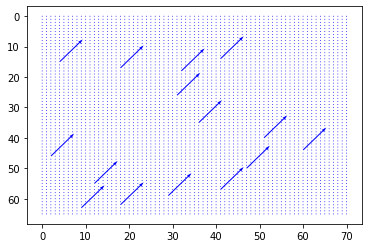

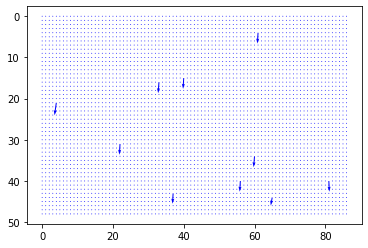

figure 63


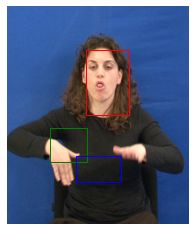

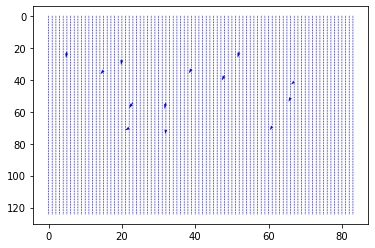

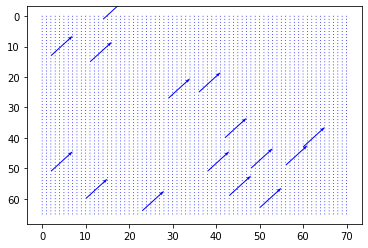

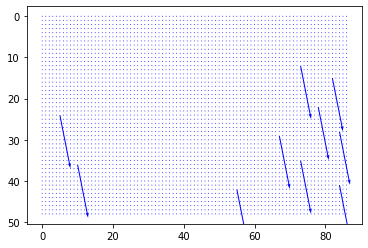

figure 64


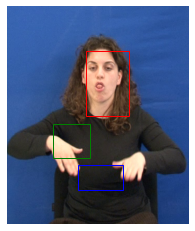

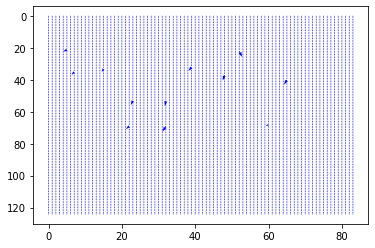

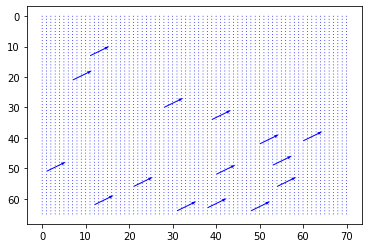

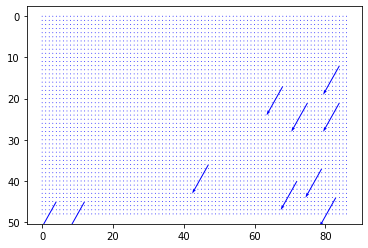

figure 65


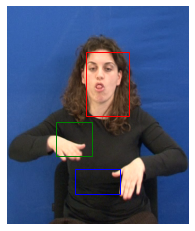

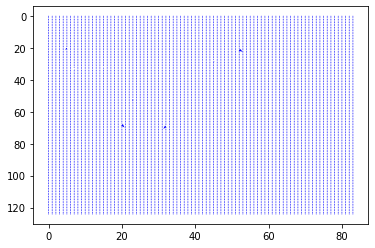

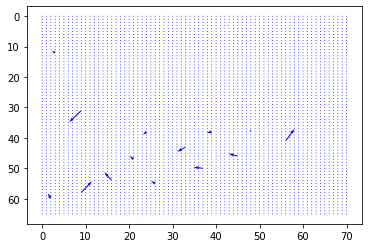

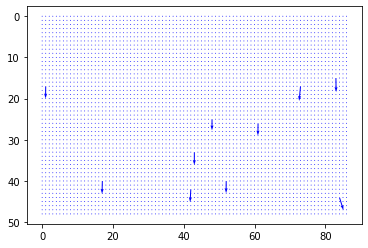

In [76]:
for i in range(2, 66):
    print('figure',i)
    img1 = img2.copy()
    img2 = cv2.imread('cv22_lab2_material/part1 - GreekSignLanguage/' + str(i + 1) + '.png', cv2.IMREAD_COLOR)
    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    head_box = [head_box[0] - int(np.round(head_displ_x)), head_box[1] - int(np.round(head_displ_y)), head_box[2],
                head_box[3]]

    left_box = [left_box[0] - int(np.round(left_displ_x)), left_box[1] - int(np.round(left_displ_y)), left_box[2],
                left_box[3]]

    right_box = [right_box[0] - int(np.round(right_displ_x)), right_box[1] - int(np.round(right_displ_y)), right_box[2],
                 right_box[3]]

    head_bb_1 = gray1[head_box[1]:head_box[1] + head_box[3], head_box[0]:head_box[0] + head_box[2]]
    left_bb_1 = gray1[left_box[1]:left_box[1] + left_box[3], left_box[0]:left_box[0] + left_box[2]]
    right_bb_1 = gray1[right_box[1]:right_box[1] + right_box[3], right_box[0]:right_box[0] + right_box[2]]

    head_bb_2 = gray2[head_box[1]:head_box[1] + head_box[3], head_box[0]:head_box[0] + head_box[2]]
    left_bb_2 = gray2[left_box[1]:left_box[1] + left_box[3], left_box[0]:left_box[0] + left_box[2]]
    right_bb_2 = gray2[right_box[1]:right_box[1] + right_box[3], right_box[0]:right_box[0] + right_box[2]]

    fig, ax = plt.subplots(frameon=False)
    ax.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    rect = patches.Rectangle((head_box[0], head_box[1]), head_box[2], head_box[3], linewidth=1, edgecolor='r',
                             facecolor='none')
    rect2 = patches.Rectangle((left_box[0], left_box[1]), left_box[2], left_box[3], linewidth=1, edgecolor='g',
                              facecolor='none')
    rect3 = patches.Rectangle((right_box[0], right_box[1]), right_box[2], right_box[3], linewidth=1, edgecolor='b',
                              facecolor='none')

    ax.set_axis_off()
    ax.add_patch(rect)
    ax.add_patch(rect2)
    ax.add_patch(rect3)

    plt.show()
    plt.clf()
    plt.close(fig)

    head_displ_x, head_displ_y, head_bb_moved_x, head_bb_moved_y = lk_Gpyramid(head_bb_1, head_bb_2, rho, e, 3, 13)
    left_displ_x, left_displ_y, left_bb_moved_x, left_bb_moved_y = lk_Gpyramid(left_bb_1, left_bb_2, rho, e, 3, 15)
    right_displ_x, right_displ_y, right_bb_moved_x, right_bb_moved_y = lk_Gpyramid(right_bb_1, right_bb_2, rho, e, 3, 10)

    display_flow(head_bb_moved_x, head_bb_moved_y)
    display_flow(left_bb_moved_x, left_bb_moved_y)
    display_flow(right_bb_moved_x, right_bb_moved_y)